# 🐶 Multi-class Dog Breed Classification 🐶

## 1. Problem
I want to be able to take a photo of any dog and be able to be told what breed of dog it is.

1. Identifying the breed of a dog given an image of a dog

## 2. Data
The data being used is from Kaggle's dog breed idenfitication competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
* You are provided with a training set and a test set of images of dogs. 
* Each image has a filename that is its unique id. 
* The dataset comprises 120 breeds of dogs. 
* The goal of the competition is to create a classifier capable of determining a dog's breed from a photo. 
* 10,000 images in the training and test sets respectively
* There are 120 breeds of dogs

## Workspace preperation

1. Import TensorFlow 2.x
2. Import TensorFlow Hub
3. Make sure we are using a GPU

In [4]:
# Import necessary tools into Google Colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF Version: ', tf.__version__)
print('TF Hub Version: ', hub.__version__)

# Check for GPU availability
print('GPU', 'available.' if tf.config.list_physical_devices('GPU') else 'not available. Change runtime type in runtime menu.')

TF Version:  2.12.0
TF Hub Version:  0.13.0
GPU available.


## Data preperation

* Turn our image data into Tensors.
* Start by accessing our data and checking out the labels.

In [5]:
# Load the label data into a dataframe
import pandas as pd
breed_labels = pd.read_csv('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/labels.csv')
breed_labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
# Display the table information
breed_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [7]:
# Check for null values
breed_labels.isna().sum()

id       0
breed    0
dtype: int64

In [8]:
# Count the amount of unique dog breeds in the dataset
num = breed_labels['breed'].nunique()
print(f'Unique dog breeds: {num}')

Unique dog breeds: 120


In [9]:
# Display the median amount of images per dog breed
median = breed_labels['breed'].value_counts().median()
print(f'Median images per breed: {median}')

Median images per breed: 82.0


<Axes: >

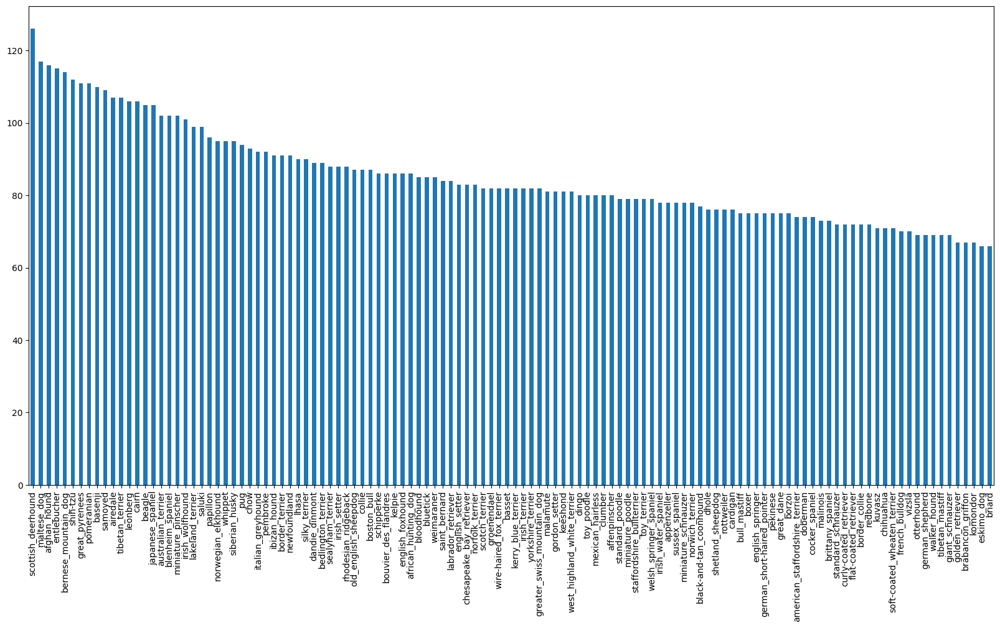

In [10]:
# Display the amount of images of each breed
breed_labels['breed'].value_counts().plot.bar(figsize=(20,10))

## Image preperation

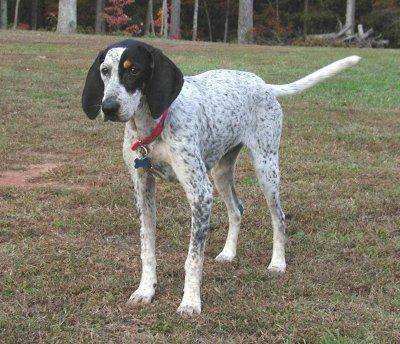

In [11]:
# Load an example image
from IPython.display import Image
Image('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg')

### Getting images and their lables
Get a list of all our image file path names

In [12]:
# Create a file path list
filenames = ['/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/' + filename  + '.jpg' for filename in breed_labels['id']]

# Display the last 10 variables in the list
filenames[:10]

['/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/tr

In [13]:
# Check that the amount of images matches the amount of file name paths in the list
import os

count_training_images = len(os.listdir('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/train/'))
count_path_names = len(filenames)

print(f'Images in training folder: {count_training_images}')
print(f'Path names in list: {count_path_names}')

if count_training_images == count_path_names:
  print('Values are equal')
else:
  print('Values are not equal')

Images in training folder: 10222
Path names in list: 10222
Values are equal


In [14]:
# Check if number of labels matches the number of filenames
import numpy as np
labels = breed_labels['breed'].to_numpy()

print(f'Number of labels: {len(labels)}')
print(f'Number of filenames: {len(filenames)}')

if len(labels) == len(filenames):
  print('Values are equal')
else:
  print('Values are not equal')

Number of labels: 10222
Number of filenames: 10222
Values are equal


In [15]:
unique_dog_breeds = np.unique(labels)
unique_dog_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn every array label into a boolean array
boolean_dog_labels = [label == unique_dog_breeds for label in labels]
DOG_IMAGE_EXAMPLE = 3

# Display the count of boolean dog labels (should be 10222)
print(f'Number of boolean dog labels: {len(boolean_dog_labels)}')

# Let's print out an example
print('=================')
print('EXAMPLE DOG BREED')
print('=================')
print(f'Dog breed: {labels[DOG_IMAGE_EXAMPLE]}')
print(f'Position in array: {boolean_dog_labels[DOG_IMAGE_EXAMPLE].argmax()}')
print('Boolean array as integer:')
print(boolean_dog_labels[DOG_IMAGE_EXAMPLE].astype(int))
print('=================')

Number of boolean dog labels: 10222
EXAMPLE DOG BREED
Dog breed: bluetick
Position in array: 15
Boolean array as integer:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]



### Creating our own validation set

In [17]:
x = filenames
y = boolean_dog_labels

In [18]:
# Set a variable which determines the amount of records we use for the next few sections.
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [19]:
# Split our data into training and validation sets
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

## Preprocess images

Writing a function to do the following:
1. Take an image file path as the input.
2. Use tensorflow to read the file and save it to a variable.
3. Turn that image into a tensor.
4. Resize the image to a standard size (224, 224).
5. Return the modified image.

In [20]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [21]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [22]:
IMAGE_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  # Read the image file
  image = tf.io.read_file(image_path)
  # Turn image into numerical tensor
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])
  # Return the image
  return image

In [23]:
# Turn our data into batches

# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

# Create function to turn all of our data into batches

In [24]:
# Define batch size
BATCH_SIZE = 32

# Turn data into batches
def create_batches(x, y=None, batch_size=BATCH_SIZE, data_valid=False, data_test=False):
  '''
  1. Creates batches of data out of image (x) and label (y) pairs.
  2. Shuffles the data if its training data but doesn't shuffle if its validation data
  3. Also accepts test data as input (no labels)
  '''
  
  # If the data is a test dataset, we likely do not have labels
  if data_test:
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only file paths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif data_valid:
    print('Creating validation data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  
    # Shuffling path names and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

# Create training and validation data
data_train = create_batches(x_train, y_train)
data_valid = create_batches(x_val, y_val, data_valid=True)

Creating training data batches...
Creating validation data batches...


In [25]:
data_train.element_spec, data_valid.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing the data batches we created

In [26]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_twenty_five_images(image, labels):
  plt.figure(figsize=(20, 20))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(unique_dog_breeds[labels[i].argmax()])
    plt.axis('off')

In [27]:
train_images, train_labels = next(data_train.as_numpy_iterator())
train_images, train_labels

(array([[[[0.23012964, 0.21836494, 0.18307081],
          [0.29670867, 0.28494397, 0.24964987],
          [0.33798146, 0.32621676, 0.29402137],
          ...,
          [0.30980435, 0.28627494, 0.33142474],
          [0.31848767, 0.28711513, 0.34593865],
          [0.32540262, 0.28554797, 0.35002625]],
 
         [[0.24395135, 0.23218665, 0.19689251],
          [0.30272165, 0.29095694, 0.25566283],
          [0.33999357, 0.32822886, 0.2960335 ],
          ...,
          [0.24302351, 0.2194941 , 0.2587098 ],
          [0.2602498 , 0.22887723, 0.27985764],
          [0.27959505, 0.2397404 , 0.2992029 ]],
 
         [[0.26319155, 0.25142685, 0.21613273],
          [0.3122625 , 0.3004978 , 0.26520368],
          [0.34054425, 0.32877955, 0.2965842 ],
          ...,
          [0.2572742 , 0.23766637, 0.26511735],
          [0.2631116 , 0.23205417, 0.27424604],
          [0.26925728, 0.23231795, 0.27473703]],
 
         ...,
 
         [[0.6004136 , 0.56370145, 0.5237067 ],
          [0.62237

In [28]:
len(train_images), len(train_labels)

(32, 32)

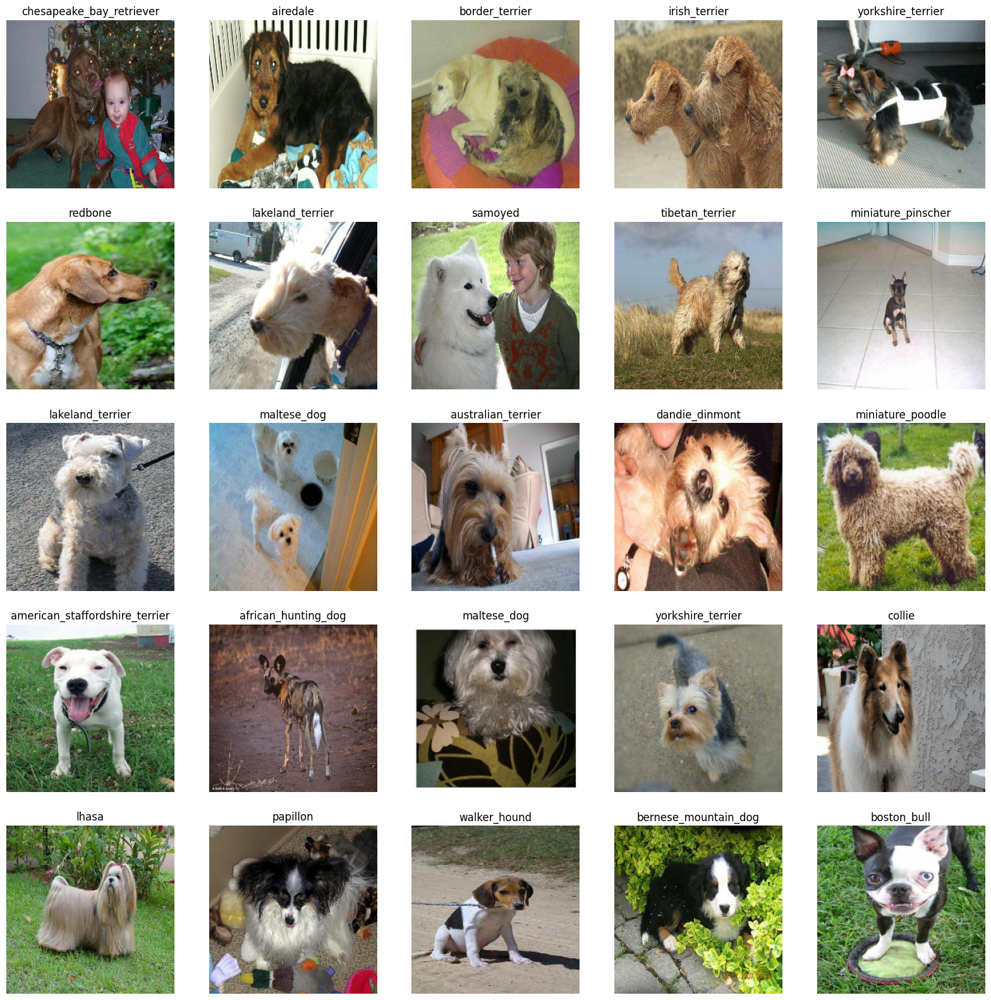

In [29]:
# Lets visualize the data in training batch
train_images, train_labels = next(data_train.as_numpy_iterator())
show_twenty_five_images(train_images, train_labels)

# Build a model

In [30]:
# Setup input shape
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_dog_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

In [31]:
# Create a function which builds a Keras model
def create_keras_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:' + MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(), metrics='accuracy')

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [32]:
model = create_keras_model()
model.summary()

Building model with:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Create two callbacks

1. Tensorboard callback
2. Early stopping callback



## Tensorboard fallback

1. Load the tensorboard notebook extension
2. Create Tensorboard callback that saves logs and passes the models fit() function.
3. Visualize the models training logs with the %tensorboard magic function


In [33]:
# Loading the notebook extension
%load_ext tensorboard

import datetime

# Build Tensorboard callback
def create_tensorboard_callback():
  # Create the log directory
  log_directory = os.path.join('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/logs', 
                                datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(log_directory)

## Early stopping callback

In [34]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

# Training a model on a subset of data

This model will train on 1000 images (instead of 10000) to make sure things are working correctly.

In [35]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [36]:
# Check to make sure we are still running a GPU
print('GPU', 'available.' if tf.config.list_physical_devices('GPU') else 'not available. Change runtime type in runtime menu.')

GPU available.


In [37]:
# Create a function to train and return a trained model
def train_model():
  model = create_keras_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=data_train,
            epochs=NUM_EPOCHS,
            validation_data=data_valid,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  save_model(model, suffix='all-images-Adam')
  return model


In [40]:
model = train_model()

Building model with:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 197s 7s/step - loss: 4.5762 - accuracy: 0.1013 - val_loss: 3.4649 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 150ms/step - loss: 1.6219 - accuracy: 0.6825 - val_loss: 2.2076 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 3s 127ms/step - loss: 0.5578 - accuracy: 0.9337 - val_loss: 1.7111 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 173ms/step - loss: 0.2499 - accuracy: 0.9850 - val_loss: 1.5019 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 126ms/step - loss: 0.1454 - accuracy: 0.9975 - val_loss: 1.4330 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 153ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.3679 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================] 

# Checking the Tensorboard logs

In [41]:
%tensorboard --logdir content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [38]:
data_valid

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [39]:
predictions = model.predict(data_valid, verbose=1)
predictions

7/7 [==============================] - 131s 19s/step


array([[0.00162677, 0.00038122, 0.0008007 , ..., 0.00558619, 0.00154089,
        0.00098566],
       [0.00511394, 0.00374764, 0.00078844, ..., 0.00574748, 0.00118095,
        0.00273703],
       [0.00637164, 0.00268966, 0.00455136, ..., 0.00298417, 0.00035344,
        0.04856046],
       ...,
       [0.00747712, 0.00379594, 0.00745684, ..., 0.00035589, 0.00105792,
        0.00302881],
       [0.00995797, 0.00773865, 0.00051055, ..., 0.0046096 , 0.00727599,
        0.00111636],
       [0.02412116, 0.00121267, 0.00175706, ..., 0.0125045 , 0.00093587,
        0.0097949 ]], dtype=float32)

In [40]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_dog_breeds[np.argmax(predictions[index])]}") # the predicted label

[9.7431627e-04 4.4909354e-02 6.4499304e-03 7.2734366e-04 1.3506528e-02
 4.2611659e-03 9.5224753e-03 1.7266859e-04 4.5458833e-03 2.5490137e-02
 9.7027840e-03 6.7222058e-03 9.5437258e-04 2.4632050e-04 2.6790431e-02
 7.6049421e-04 4.9191283e-04 4.8947218e-03 1.9161789e-02 4.1446590e-04
 9.4194323e-02 9.3087293e-02 1.1354836e-02 5.8550159e-03 7.2754310e-03
 1.6014278e-03 9.8994039e-03 2.6294019e-03 1.3519137e-03 2.8533558e-03
 8.3880574e-03 8.6931596e-03 5.4572709e-03 2.6937563e-03 5.9765414e-03
 3.7896866e-03 6.6591194e-04 4.3874350e-03 4.1782861e-03 6.8803108e-03
 7.9861103e-04 3.0934147e-03 6.0575042e-04 3.2853320e-02 2.1708549e-03
 9.4946224e-04 1.8904680e-04 1.1698427e-03 1.4644895e-04 4.3230029e-03
 3.2780159e-03 2.3189601e-03 1.6438147e-03 8.8095799e-04 4.2131508e-04
 5.2104886e-03 2.2203450e-03 3.8769316e-02 2.3062970e-02 6.5912429e-04
 8.2539851e-03 1.9706532e-02 1.2007951e-02 1.6103871e-02 3.6705914e-04
 1.8574974e-03 1.0892814e-03 8.2698606e-02 2.5177340e-03 2.1553448e-04
 5.963

In [41]:
def get_pred_label(prediction_probabilities):
  return unique_dog_breeds[np.argmax(prediction_probabilities)]

# Test the function
pred_label = get_pred_label(predictions[0])
pred_label

'miniature_pinscher'

In [42]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_dog_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(data_valid)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [43]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)
  

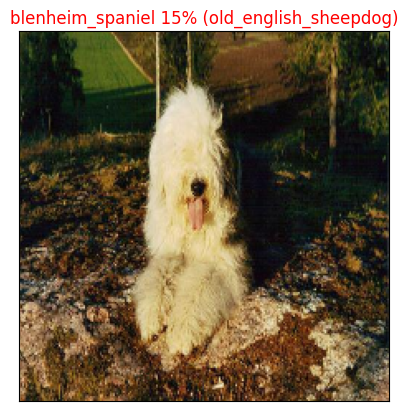

In [50]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          # Input a number between 0 and 199 to see what the models results are.
          n=7)

In [51]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_dog_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

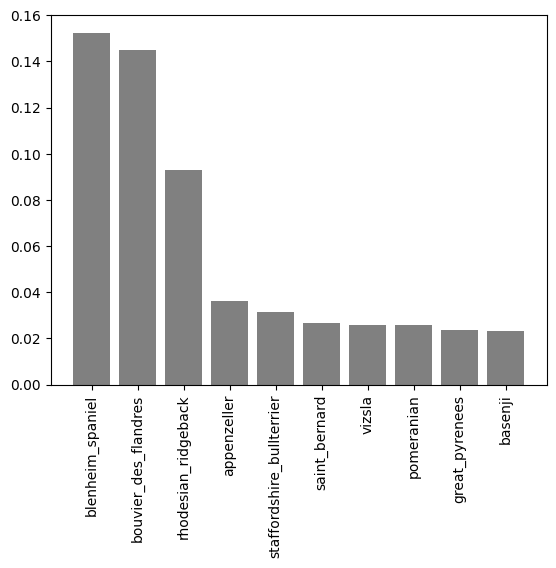

In [52]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=7)

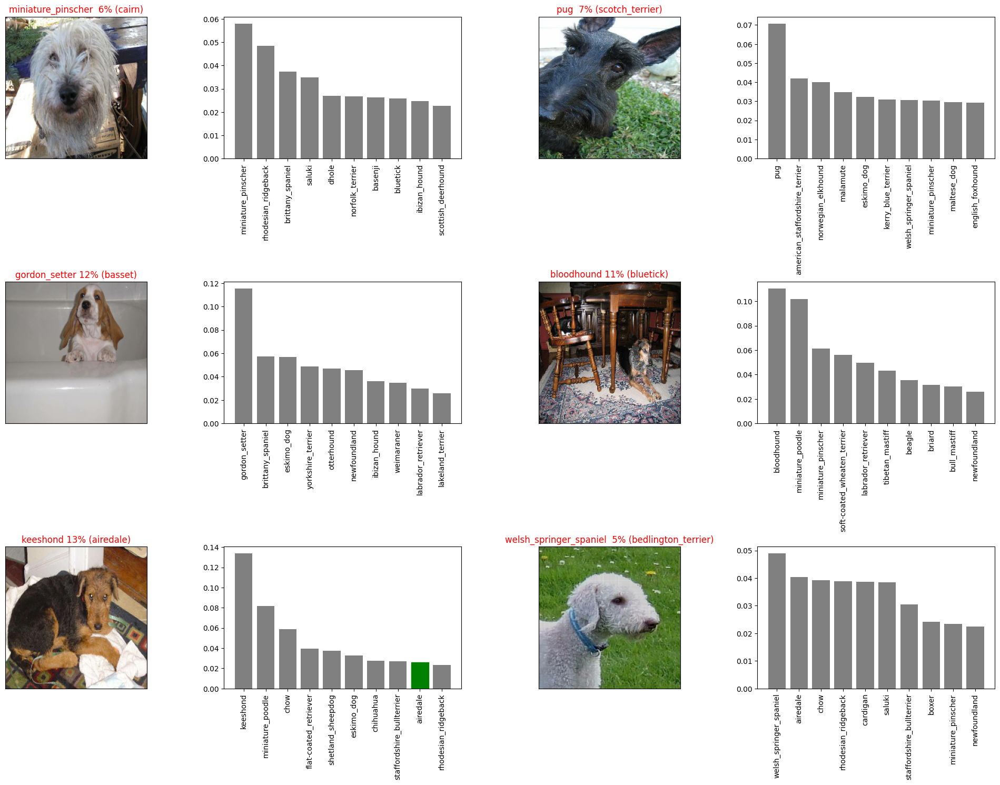

In [53]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a trained model

In [54]:
# Create a function to save model

def save_model(model, suffix=None):
  '''
  Saves a given model in a directory
  '''
  # Create a model directory pathname with current time
  model_directory = os.path.join('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models',
                                  datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = model_directory + '-' + suffix + '.h5'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [55]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [47]:
# Saving the model
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10231680258184-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10231680258184-1000-images-mobilenetv2-Adam.h5'

In [48]:
# Loading the model
model_1000_images = load_model('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-06491680245345-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-06491680245345-1000-images-mobilenetv2-Adam.h5


In [49]:
model.evaluate(data_valid)

7/7 [==============================] - 1s 94ms/step - loss: 5.6687 - accuracy: 0.0000e+00


[5.668728828430176, 0.0]

In [50]:
model_1000_images.evaluate(data_valid)

7/7 [==============================] - 1s 102ms/step - loss: 1.2664 - accuracy: 0.6200


[1.2663764953613281, 0.6200000047683716]

# Training a model on full data

In [51]:
# Size of the full dataset
len(x), len(y)

(10222, 10222)

In [56]:
# Turn full training data in a data batch
full_data = create_batches(x, y)

Creating training data batches...


In [57]:
full_model = create_keras_model()

Building model with:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [58]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [57]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 51s 134ms/step - loss: 1.3371 - accuracy: 0.6667
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.3976 - accuracy: 0.8811
Epoch 3/100
320/320 [==============================] - 39s 121ms/step - loss: 0.2379 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1531 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 38s 118ms/step - loss: 0.1048 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0757 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0579 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0458 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0388 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 38s 120m

In [58]:
# Save model to file
save_model(full_model, suffix="all-images-Adam2")

Saving model to: /content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10381680259123-all-images-Adam2.h5...


'/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10381680259123-all-images-Adam2.h5'

In [59]:
fully_loaded_model = load_model('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10381680259123-all-images-Adam2.h5')

Loading saved model from: /content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/models/20230331-10381680259123-all-images-Adam2.h5


In [71]:
test_path = '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/dd7bf84df93991b7c15ec739c82acc04.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e13f3871a8b4a745717ba6903f0dfe05.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e520e4cd7608c47cd9017bb87e88f334.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e25f28a6c07bf3909c4310b2685f6caf.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/e64

In [72]:
len(test_filenames)

10343

In [73]:
test_data = create_batches(test_filenames, data_test=True)

Creating test data batches


In [74]:
# Make predictions on test data batch using the loaded full model
test_predictions = fully_loaded_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 203s 616ms/step


In [85]:
# Check out the test predictions
test_predictions[:10]

array([[9.9990380e-01, 1.2685648e-10, 4.4117265e-10, ..., 1.4806331e-09,
        1.6867396e-08, 1.1867407e-07],
       [5.2513133e-08, 7.0041253e-08, 2.8578487e-10, ..., 1.6444089e-09,
        9.9911410e-01, 9.3697487e-08],
       [2.3129496e-09, 1.2731207e-05, 4.7127170e-08, ..., 4.3362146e-05,
        1.3100748e-05, 6.4056732e-11],
       ...,
       [5.8725038e-09, 1.5818087e-09, 1.2647657e-08, ..., 2.0251496e-06,
        7.4593081e-05, 2.8381994e-08],
       [9.6966858e-08, 1.8912901e-11, 1.4175042e-07, ..., 6.0511649e-09,
        3.2658685e-11, 1.7165057e-07],
       [2.5129248e-08, 1.5343480e-07, 9.0946905e-08, ..., 2.3716220e-09,
        4.8402249e-08, 3.5777429e-08]], dtype=float32)

In [86]:
test_predictions.shape

(10343, 120)

# Preparing test dataset predictions for Kaggle

In [88]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_dog_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [89]:
# Append test image ID's to predictions DataFrame
test_path = '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/test/'
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e427b9e1ab1b7f09cfb02ac073f56f2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e13f3871a8b4a745717ba6903f0dfe05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6b1859592468c8ffc1a73f87b201ba7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e520e4cd7608c47cd9017bb87e88f334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_dog_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,9.999038e-01,1.268565e-10,4.411727e-10,2.211342e-11,8.737539e-11,1.846173e-11,1.284771e-09,1.320420e-11,7.323332e-11,...,6.940676e-09,1.066806e-09,2.133095e-10,1.635841e-09,3.326196e-11,9.406066e-12,1.497697e-10,1.480633e-09,1.686740e-08,1.186741e-07
1,e427b9e1ab1b7f09cfb02ac073f56f2d,5.251313e-08,7.004125e-08,2.857849e-10,4.333445e-07,9.928174e-11,9.880795e-11,3.725097e-07,7.790339e-10,2.772965e-11,...,6.940587e-11,4.753604e-08,2.793270e-11,1.674532e-06,1.523227e-10,2.768504e-08,1.849159e-07,1.644409e-09,9.991141e-01,9.369749e-08
2,e13f3871a8b4a745717ba6903f0dfe05,2.312950e-09,1.273121e-05,4.712717e-08,7.437281e-06,4.214656e-05,9.379756e-09,1.077690e-06,5.601706e-10,3.321299e-06,...,3.117546e-10,6.803254e-11,4.136382e-07,1.445413e-05,2.843518e-05,2.835167e-09,3.110123e-09,4.336215e-05,1.310075e-05,6.405673e-11
3,e6b1859592468c8ffc1a73f87b201ba7,2.104679e-08,7.706218e-09,2.579782e-10,2.137525e-05,3.838878e-08,1.351456e-06,2.782459e-06,4.676297e-05,6.551095e-05,...,1.072563e-07,3.317288e-08,7.660466e-07,8.872651e-02,1.414536e-08,1.826973e-08,1.656993e-08,1.972910e-08,1.677132e-03,1.390791e-06
4,e520e4cd7608c47cd9017bb87e88f334,3.099890e-01,7.084493e-09,2.972822e-09,4.221205e-12,2.914567e-08,1.823351e-08,7.121146e-11,1.753232e-08,4.457211e-10,...,1.117372e-03,2.240846e-06,1.178159e-09,2.290687e-08,2.049180e-08,9.462378e-09,2.491185e-07,4.302039e-09,2.266719e-07,1.848212e-05


In [84]:
preds_df.to_csv('/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/full_submission_1_mobilienetV2_adam.csv',
                 index=False)

# Make predictions on custom images

In [128]:
custom_dog_path = '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/matt_dogs/'
custom_image_paths = [custom_dog_path + fname for fname in os.listdir(custom_dog_path)]

custom_image_paths

['/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/matt_dogs/Beagle-standing-in-a-frosty-field-on-a-cold-morning.jpeg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/matt_dogs/https___cdn.cnn.com_cnnnext_dam_assets_220818142713-dogs-tears-emotions-wellness-stock.jpg',
 '/content/drive/MyDrive/development/machine-learning/projects/dog-vision/data/dog-breed-identification/matt_dogs/MBS_DogEvolution_blg_031820.jpeg']

In [129]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_batches(custom_image_paths, data_test=True)

Creating test data batches


In [130]:
# Make predictions on the custom data
custom_preds = fully_loaded_model.predict(custom_data)


1/1 [==============================] - 0s 59ms/step


In [131]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['english_foxhound', 'eskimo_dog', 'dingo']

In [132]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

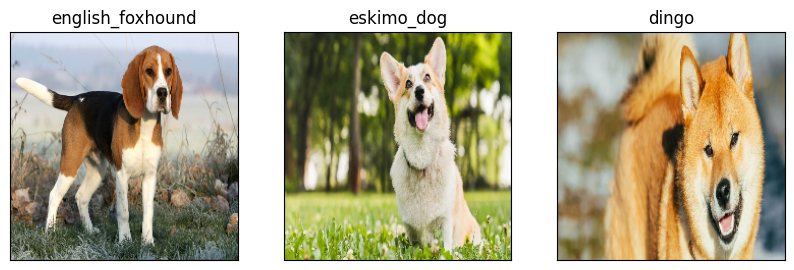

In [133]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)